## 

## Introduction 
* In the ever-evolving landscape of business and commerce, understanding customer behavior is paramount for strategic decision-making. 
* One effective way to gain insights into customer purchasing patterns is through predictive modeling. This project endeavors to employ a decision tree classifier to forecast whether a customer will make a purchase, leveraging a rich dataset encompassing demographic information and behavioral data. 
* By doing so, we aim to equip businesses with a predictive tool that can enhance their ability to tailor marketing strategies and optimize customer engagement.

## Project Overview 
* The project centers around the creation and utilization of a decision tree classifier, a powerful machine learning algorithm, to predict customer purchasing behavior. Leveraging a diverse dataset that incorporates demographic details and behavioral data, the aim is to develop a robust model capable of making accurate predictions regarding a customer's likelihood to purchase a product or service. 
* The project workflow encompasses data exploration, preprocessing, model training, and evaluation to ensure the classifier's efficacy. The ultimate goal is to provide businesses with a valuable tool for customer relationship management and targeted marketing.

### Problem Statement 
* Despite the increasing availability of data, accurately predicting customer purchase behavior remains a complex challenge. The aim of this project is to address this challenge by developing a decision tree classifier capable of discerning patterns within demographic and behavioral data to forecast purchasing decisions. 
* Key issues involve identifying relevant features, mitigating potential biases in the dataset, and optimizing the decision tree model for both accuracy and interpretability. By tackling these challenges, we seek to empower businesses with a valuable tool for enhancing customer targeting and optimizing marketing initiatives.

## Import Libraries 
* These are the required libraries needed to read data 

In [24]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns 
%matplotlib inline

#### Load Data 

In [2]:
# Load the dataset into a DataFrame
bank_data = pd.read_csv(r'C:\Users\wanji\Desktop\ML Projects\bank+marketing\bank\bank-full.csv', sep=';')
bank_data

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown,yes
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown,yes
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,yes
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,unknown,no


In [20]:
bank_data.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no


In [21]:
bank_data.tail()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown,yes
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown,yes
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,yes
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,unknown,no
45210,37,entrepreneur,married,secondary,no,2971,no,no,cellular,17,nov,361,2,188,11,other,no


## Data Understanding
This involves:
* Shape
* Columns, column names
* Column Datatypes
    


In [3]:
file_path = r'C:\Users\wanji\Desktop\ML Projects\bank+marketing\bank\bank-full.csv'
bank_data= pd.read_csv(file_path, sep=';')
#Function to determine the shape, column names 
def analyze_dataset(dataset):
    shape = dataset.shape
    column_names = dataset.columns
    columns = dataset.values.tolist()
    return shape, column_names,columns


In [4]:
shape, column_names,columns= analyze_dataset(bank_data)
print("Shape:", shape)
print("Column Names:", column_names)
print("Columns:",columns)


Shape: (45211, 17)
Column Names: Index(['age', 'job', 'marital', 'education', 'default', 'balance', 'housing',
       'loan', 'contact', 'day', 'month', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'y'],
      dtype='object')
Columns: [[58, 'management', 'married', 'tertiary', 'no', 2143, 'yes', 'no', 'unknown', 5, 'may', 261, 1, -1, 0, 'unknown', 'no'], [44, 'technician', 'single', 'secondary', 'no', 29, 'yes', 'no', 'unknown', 5, 'may', 151, 1, -1, 0, 'unknown', 'no'], [33, 'entrepreneur', 'married', 'secondary', 'no', 2, 'yes', 'yes', 'unknown', 5, 'may', 76, 1, -1, 0, 'unknown', 'no'], [47, 'blue-collar', 'married', 'unknown', 'no', 1506, 'yes', 'no', 'unknown', 5, 'may', 92, 1, -1, 0, 'unknown', 'no'], [33, 'unknown', 'single', 'unknown', 'no', 1, 'no', 'no', 'unknown', 5, 'may', 198, 1, -1, 0, 'unknown', 'no'], [35, 'management', 'married', 'tertiary', 'no', 231, 'yes', 'no', 'unknown', 5, 'may', 139, 1, -1, 0, 'unknown', 'no'], [28, 'management', 'single', 'te

In [6]:
# Column Datatype
# Column Datatype
file_path = r'C:\Users\wanji\Desktop\ML Projects\bank+marketing\bank\bank-full.csv'
bank_data = pd.read_csv(file_path, sep=';')

def column_data_type(dataset):
    column_type = dataset.dtypes
    return column_type

# Call the function with the DataFrame 'bank_data'
data_types = column_data_type(bank_data)
print("Data Types:", data_types)


Data Types: age           int64
job          object
marital      object
education    object
default      object
balance       int64
housing      object
loan         object
contact      object
day           int64
month        object
duration      int64
campaign      int64
pdays         int64
previous      int64
poutcome     object
y            object
dtype: object


In [9]:
def get_dataset_statistics(dataset):
    statistics = dataset.describe(include ='all')
    return statistics

# Call the function with the DataFrame 'bank_data'
get_statistics = get_dataset_statistics(bank_data)
get_statistics

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
count,45211.000000,45211,45211,45211,45211,45211.000000,45211,45211,45211,45211.000000,45211,45211.000000,45211.000000,45211.000000,45211.000000,45211,45211
unique,NaN,12,3,4,2,NaN,2,2,3,NaN,12,NaN,NaN,NaN,NaN,4,2
top,NaN,blue-collar,married,secondary,no,NaN,yes,no,cellular,NaN,may,NaN,NaN,NaN,NaN,unknown,no
freq,NaN,9732,27214,23202,44396,NaN,25130,37967,29285,NaN,13766,NaN,NaN,NaN,NaN,36959,39922
mean,40.936210,NaN,NaN,NaN,NaN,1362.272058,NaN,NaN,NaN,15.806419,NaN,258.163080,2.763841,40.197828,0.580323,NaN,NaN
std,10.618762,NaN,NaN,NaN,NaN,3044.765829,NaN,NaN,NaN,8.322476,NaN,257.527812,3.098021,100.128746,2.303441,NaN,NaN
min,18.000000,NaN,NaN,NaN,NaN,-8019.000000,NaN,NaN,NaN,1.000000,NaN,0.000000,1.000000,-1.000000,0.000000,NaN,NaN
25%,33.000000,NaN,NaN,NaN,NaN,72.000000,NaN,NaN,NaN,8.000000,NaN,103.000000,1.000000,-1.000000,0.000000,NaN,NaN
50%,39.000000,NaN,NaN,NaN,NaN,448.000000,NaN,NaN,NaN,16.000000,NaN,180.000000,2.000000,-1.000000,0.000000,NaN,NaN
75%,48.000000,NaN,NaN,NaN,NaN,1428.000000,NaN,NaN,NaN,21.000000,NaN,319.000000,3.000000,-1.000000,0.000000,NaN,NaN


### Data Cleaning

In [19]:
# Check for duplicate values
# Function to check for duplicates
def check_duplicates(dataset):
    duplicates = dataset.duplicated().sum()
    return duplicates
# Call the function
check_duplicates_result = check_duplicates(bank_data)
check_duplicates_result


0

In [17]:
# Check for missing values
def check_missing_values(dataset):
    missing_values = dataset.isnull().sum()
    return missing_values

# Call the function
missing_values_result = check_missing_values(bank_data)
missing_values_result

age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
y            0
dtype: int64

* From the above there are no duplicates nor missing values, which shows that the dataset is clean and comprehensive analysis/EDA can be done 

## EDA
* In depth understanding of the dataset

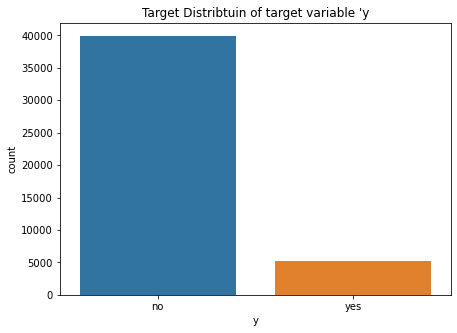

In [25]:
# Showing the target distribution of 'Y'
plt.figure(figsize=(7,5))
sns.countplot(x='y', data=bank_data)
plt.title("Target Distribtuin of target variable 'y")
plt.show()

*  The distribution shows the high count of 'no' as the general outcome than the 'yes' 
* The y in this case represents the general/rather total outcome of the 'poutcome'

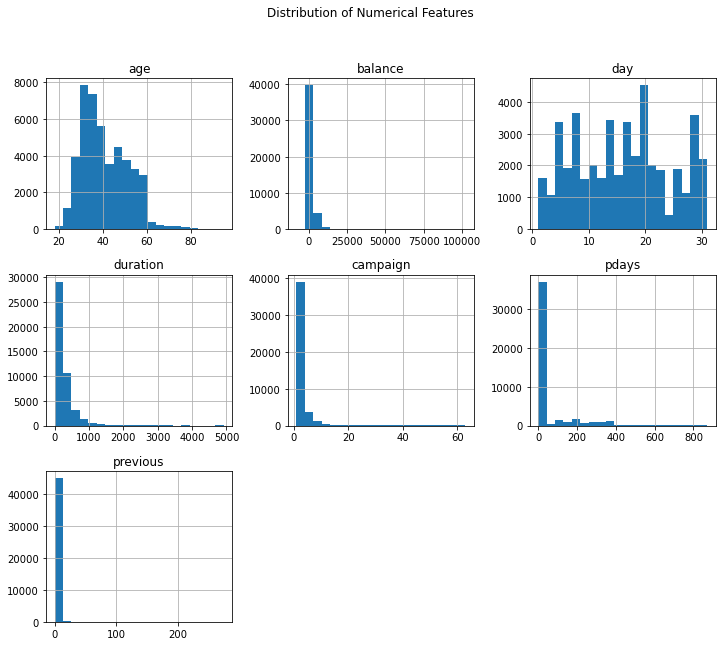

In [26]:
# Visualize the distribution of numerical features
numerical_features = bank_data.select_dtypes(include=['int64', 'float64']).columns
bank_data[numerical_features].hist(bins=20, figsize=(12, 10))
plt.suptitle('Distribution of Numerical Features')
plt.show()

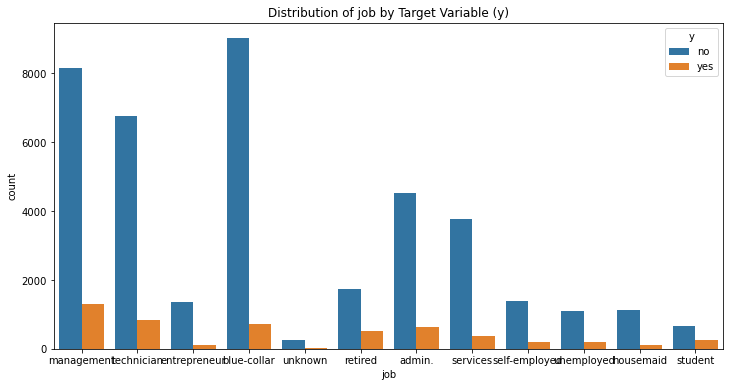

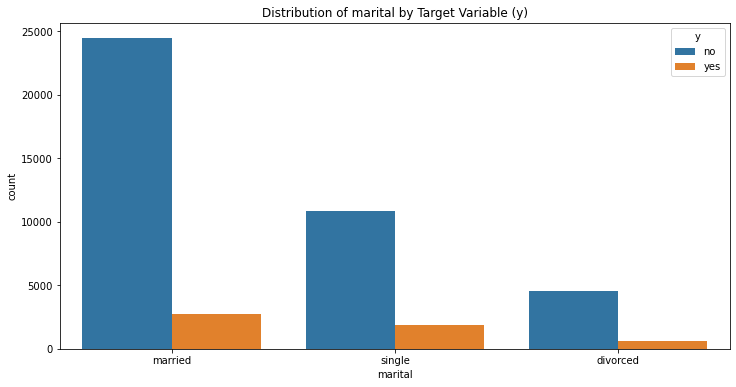

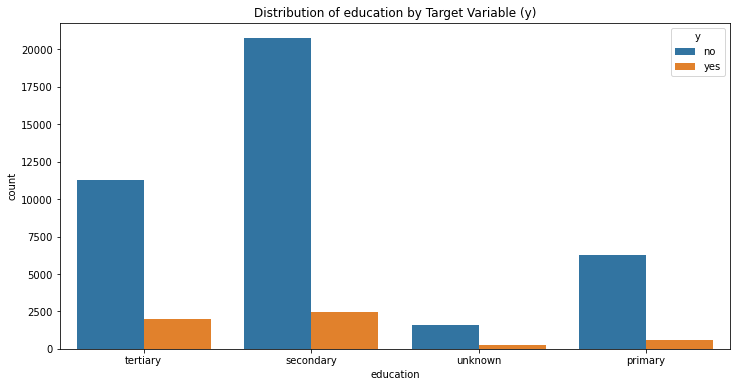

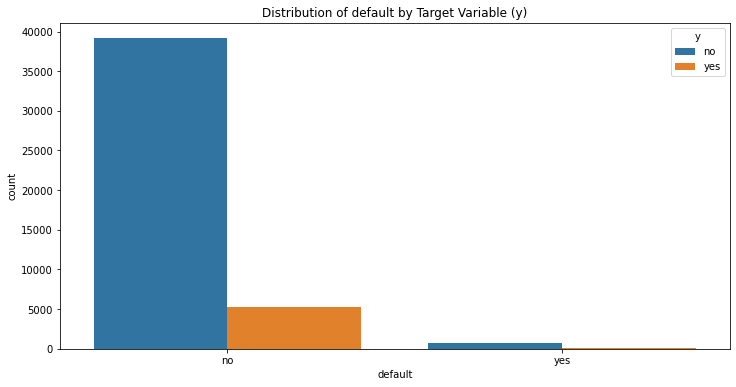

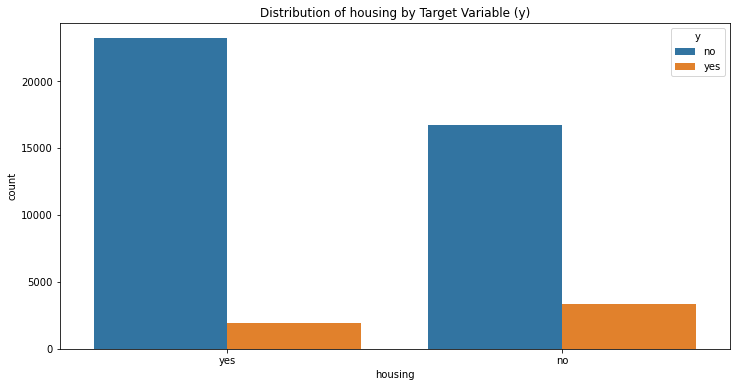

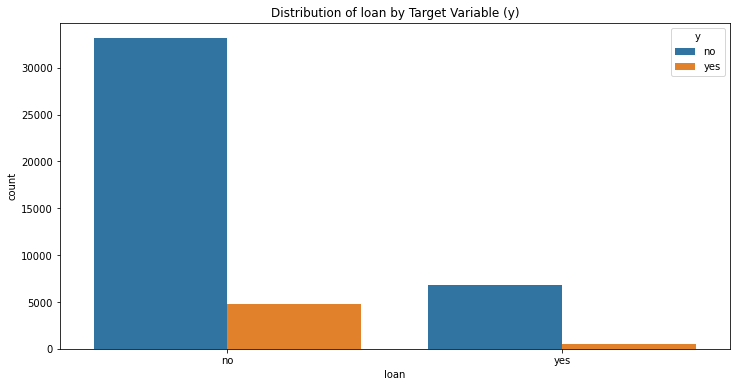

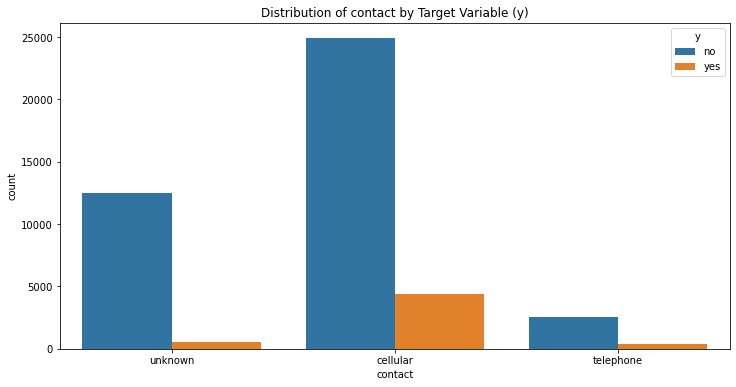

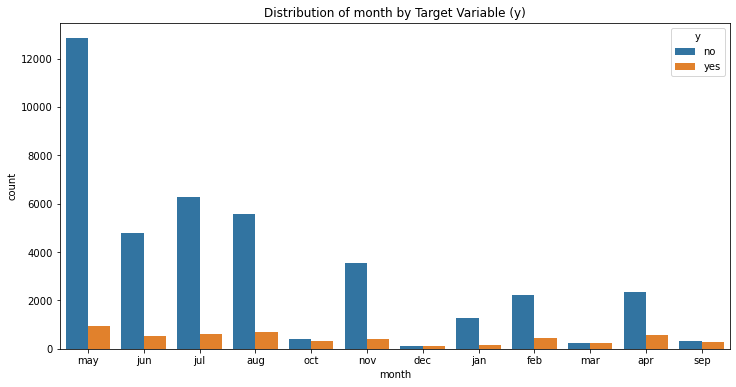

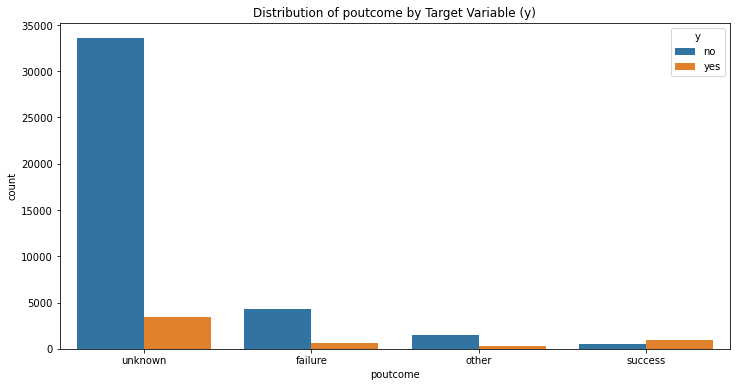

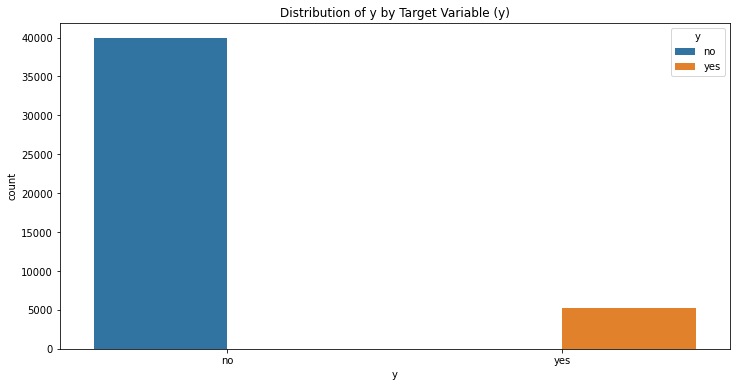

In [29]:
# Visualize categorical features
categorical_features = bank_data.select_dtypes(include=['object']).columns
for feature in categorical_features:
    plt.figure(figsize=(12, 6))
    sns.countplot(x=feature, data=bank_data, hue='y')
    plt.title(f'Distribution of {feature} by Target Variable (y)')
    plt.show()

In [32]:

# Columns Of Interest to check for outliers
columns_of_interest = ['age', 'balance', 'duration', 'campaign', 'pdays', 'previous']

# Identify outliers for each selected column
outlier_results = {}
for column in columns_of_interest:
    column_data = bank_data[column]
    results = identify_outliers(column_data, threshold=2, return_indices=True, return_z_scores=True)
    outlier_results[column] = results

# Print results
for column, results in outlier_results.items():
    print(f"Column: {column}")
    print("Outliers:", results['outliers'])
    print("Outlier Indices:", results.get('outlier_indices', None))
    print("Z Scores:", results.get('z_scores', None))
    print("\n")


Column: age
Outliers: [66, 83, 75, 75, 67, 83, 70, 65, 65, 65, 68, 65, 64, 69, 75, 69, 69, 72, 71, 64, 64, 66, 70, 67, 19, 66, 76, 66, 69, 19, 83, 71, 85, 72, 63, 63, 90, 67, 64, 71, 64, 82, 63, 73, 74, 65, 71, 64, 75, 68, 78, 85, 80, 71, 78, 73, 66, 75, 63, 94, 68, 72, 83, 19, 66, 79, 70, 19, 65, 64, 63, 70, 64, 78, 68, 83, 73, 76, 83, 77, 69, 19, 73, 63, 19, 74, 67, 68, 73, 63, 77, 63, 65, 71, 65, 68, 67, 71, 68, 80, 82, 66, 65, 65, 65, 75, 77, 78, 78, 65, 86, 70, 70, 76, 19, 69, 72, 67, 74, 66, 77, 64, 74, 79, 71, 70, 74, 66, 70, 78, 73, 69, 73, 64, 63, 95, 65, 74, 71, 67, 78, 63, 71, 66, 64, 64, 69, 65, 66, 75, 75, 65, 69, 82, 19, 74, 81, 76, 19, 67, 66, 72, 75, 72, 71, 65, 72, 70, 77, 68, 73, 70, 85, 67, 19, 19, 63, 66, 19, 83, 78, 73, 64, 79, 68, 19, 66, 71, 63, 71, 80, 69, 72, 78, 69, 79, 70, 64, 69, 71, 66, 82, 67, 63, 69, 66, 66, 65, 81, 79, 71, 63, 63, 79, 67, 63, 79, 19, 69, 73, 75, 72, 71, 63, 75, 67, 66, 78, 68, 66, 75, 80, 80, 65, 67, 74, 73, 65, 65, 67, 66, 67, 71, 66, 6

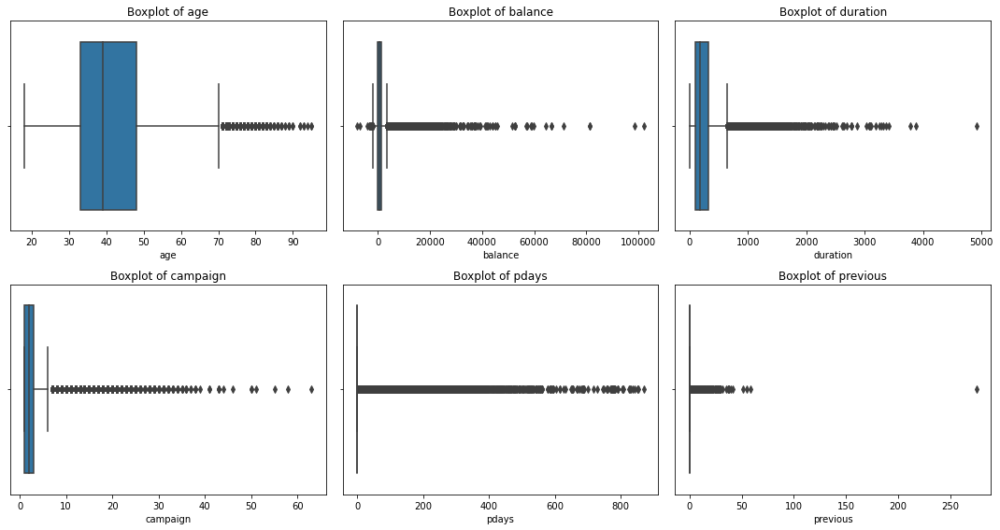

In [33]:
# Plot boxplots to visualize outliers
plt.figure(figsize=(15, 8))
for i, column in enumerate(columns_of_interest, 1):
    plt.subplot(2, 3, i)
    sns.boxplot(x=bank_data[column])
    plt.title(f'Boxplot of {column}')

plt.tight_layout()
plt.show()

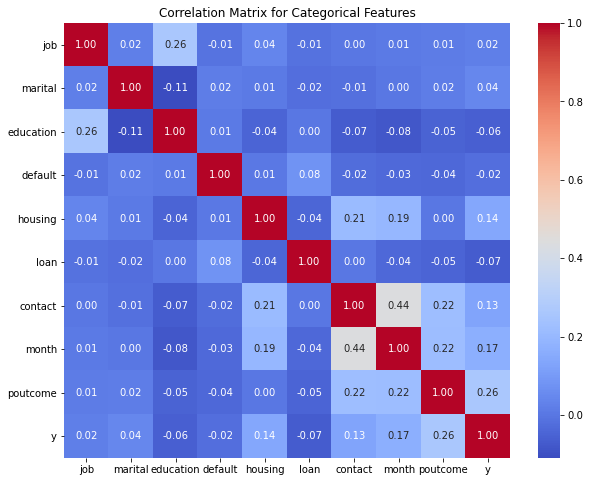

In [34]:
categorical_corr_matrix = bank_data[categorical_features].apply(lambda x: pd.factorize(x)[0]).corr()
plt.figure(figsize=(10, 8))
sns.heatmap(categorical_corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix for Categorical Features')
plt.show()
